<< [Índice](./intro.html)

In [ ]:
!pip install pygad

In [ ]:
import warnings

warnings.filterwarnings('ignore')

# **Algoritmo genético**

El algoritmo genético es un tipo de algoritmo evolutivo donde se imita a la naturaleza y se hace uso del concepto darwiniano de la sobrevivencia del más fuerte. Según Gad, A., creador de la librería PyGAD para algoritmos evolutivos en python, el algoritmo genético se compone de 7 pasos:


1.   Creación de la población inicial
2.   Evaluación de la función de fitness
3.   Selección de los padres
4.   Piscina de apareamiento
5.   Variaciones (crossover y mutación)
6.   Nueva generacion
7.   Mejor solución ( Si la mejor solución no es hallada, se regresa al paso 2)

(2023, p.1)




# **Optimización de la función Rosenbrock con algoritmo genético para dos dimensiones**

Recordemos que el valor óptimo de la función de Rosenbrock es en el punto (1,1) para dos dimensiones.

Procederemos a hacer el ejercicio en 2 y 3 dimensiones utilizando los siguientes parámetros:

num_generations = 2000,
sol_per_pop = 10,
um_parents_mating=5,
num_genes=2,
parent_selection_type="sss",
fitness_func= fitness_fucntion,
save_solutions=True,
mutation_type = "random",
mutation_percent_genes = 50,


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


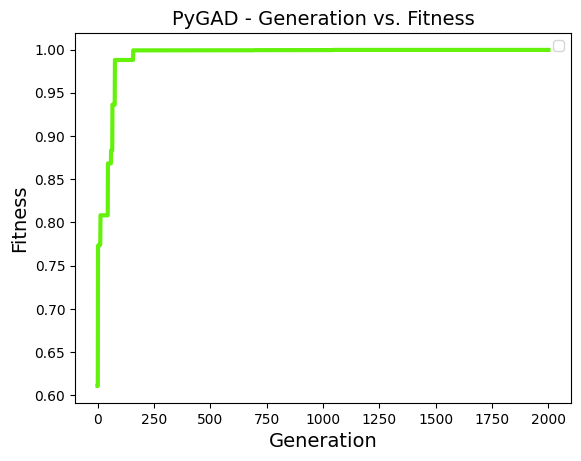



La mejor solución obtenida al terminar el algoritmo fue el vector: [0.97914281 0.9591281 ] con un fitness de 0.9995485790582193



In [ ]:
import pygad
import numpy as np


def rosenbrock_function(x1, x2):
    return (1 - x1)**2 + 100 * (x2 - x1**2)**2


# Evalua 1/(1 + func(sol_actual)), si la función es cercana al mínimo, el resultado de la división será más grande y viceversa
def fitness_fucntion(ga_instance, solution, solution_index):
    return 1.0/(1.0+ np.abs(rosenbrock_function(solution[0],solution[1])))

best_solutions_each_generation = []

def on_generation(ga_instance):
    best_solutions_each_generation.append(ga_instance.best_solution()[0])

ga_instance =  pygad.GA(num_generations = 2000,
                        sol_per_pop = 10,
                        num_parents_mating=5,
                        num_genes=2,
                        parent_selection_type="sss",
                        fitness_func= fitness_fucntion,
                        save_solutions=True,
                        mutation_type = "random",
                        mutation_percent_genes = 50,
                        on_generation=on_generation)

ga_instance.run()
ga_instance.plot_fitness()


best_solution = ga_instance.best_solution()[0]
fitness_best_solution = ga_instance.best_solution()[1]


print()
print()

print(f'La mejor solución obtenida al terminar el algoritmo fue el vector: {best_solution} con un fitness de {fitness_best_solution}')
print()



In [ ]:
import matplotlib.pyplot as plt
import imageio
import random
from IPython.display import Video
from moviepy.editor import VideoFileClip


# Seteo los ejes sobre los que voy a trabajar
plt.xlim(-2, 2)
plt.ylim(-2, 2)

# Generamos la nube de puntos sobre la que se generarán las curvas de nivel
x = np.linspace(-2, 2, 100)
y = np.linspace(-2, 2, 100)
x, y = np.meshgrid(x, y)
z = rosenbrock_function(x, y)

# Generamos las curva de nivel de la función
plt.contour(x, y, z, levels=100, cmap='viridis')

# Etiquetas de los ejes
plt.xlabel('$x_{1} \;  \in \; \mathbb{R}$')
plt.ylabel('$x_{2} \;  \in \; \mathbb{R}$')

# Solucion real
plt.scatter(1, 1, color='blue', label='(1, 1)')


# Mostrar el gráfico
plt.colorbar(label='Niveles en  $z \; \in \mathbb{R}$')
plt.title('Mejor solucion de la generacion 0')
plt.grid(True)

images = []
# Colors to plot points that are the best solution of each generation so that if points overlap the change is seen
colors = ['red', 'yellow', 'green', 'orange', 'pink']

for generation  in range(0, len(best_solutions_each_generation),10):
    # Se geeneran las etiquetas de cada frame del video y su respectiva generación
    plt.title(f'Mejor solucion de la generacion {generation+1} (punto azul solución real)')

    # Graficar la mejor solución de cada generación
    plt.scatter(best_solutions_each_generation[generation][0], best_solutions_each_generation[generation][1], color = colors[random.randint(0, 4)])

    # Se guarda cada frame como imagen para luego usar las imagenes guardadas para generar el video
    plt.savefig('media'+'/'+f'generation_{generation}.png')

    # Se agrega la imagen a la lista de imagenes para luego generar el gif
    images.append(imageio.imread('media'+'/'+f'generation_{generation}.png'))

# Se genera el gif a partir de la lista de imagenes y se guarda en el sistema de archivos
imageio.mimsave('media'+'/'+'rosenbrock_contour.gif', images, fps=1000)

# Para no mostrar la figura actual aún
plt.close()



gif_path = 'media'+'/'+'rosenbrock_contour.gif'

# Convertir GIF a video
clip = VideoFileClip(gif_path)
video_path = 'media'+'/'+'output.mp4'
clip.write_videofile(video_path, fps=1000, logger=None)

# Mostrar el video
Video(video_path, embed=True)


Ahora hacemos el ejercicio en 3 dimensiones

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


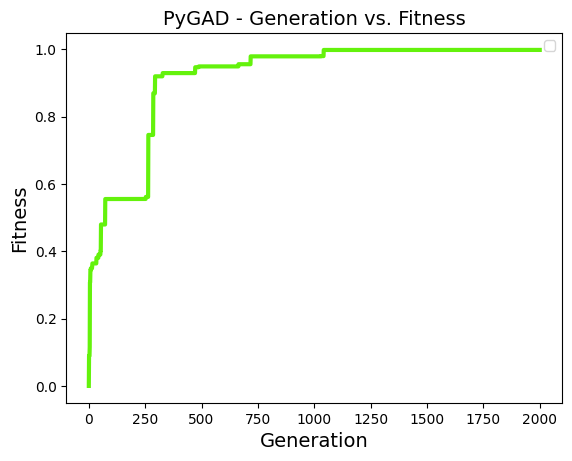



La mejor solución obtenida al terminar el algoritmo fue el vector: [0.99163071 0.98074558 0.96253283] con un fitness de 0.9977667449103942



In [ ]:
import pygad
import numpy as np


# Función de rosenbrock en 3 dimensiones
def rosenbrock_3_dim(x,y,z):
    return ((1 - x)**2 + 100 * (y - x**2)**2) + ((1 - y**2)**2 + 100 * (z - y**2)**2)


# Evalua 1/(1 + func(sol_actual)), si la función es cercana al mínimo, el resultado de la división será más grande y viceversa
def fitness_fucntion(ga_instance, solution, solution_index):
    return 1.0/(1.0+ np.abs(rosenbrock_3_dim(solution[0],solution[1], solution[2])))

best_solutions_each_generation = []

def on_generation(ga_instance):
    best_solutions_each_generation.append(ga_instance.best_solution()[0])

ga_instance =  pygad.GA(num_generations = 2000,
                        sol_per_pop = 10,
                        num_parents_mating=5,
                        num_genes=3,
                        parent_selection_type="sss",
                        fitness_func= fitness_fucntion,
                        save_solutions=True,
                        mutation_type = "random",
                        mutation_percent_genes = 50,
                        on_generation=on_generation)

ga_instance.run()
ga_instance.plot_fitness()


best_solution = ga_instance.best_solution()[0]
fitness_best_solution = ga_instance.best_solution()[1]


print()
print()

print(f'La mejor solución obtenida al terminar el algoritmo fue el vector: {best_solution} con un fitness de {fitness_best_solution}')
print()



Ahora graficamos con respecto a X1 y X3:

In [ ]:
# Función de rosenbrock en con respecto a x,z

def rosenbrock_3_dim_x_z(x, z):
    return ((1 - x)**2 + 100 * (0 - x**2)**2) + ((1 - 0**2)**2 + 100 * (z - 0**2)**2)

    # Función de rosenbrock en con respecto a y,z
def rosenbrock_3_dim_y_z(y,z):
    return ((1 - 0)**2 + 100 * (y - 0**2)**2) + ((1 - y**2)**2 + 100 * (z - y**2)**2)

In [ ]:
import matplotlib.pyplot as plt
import imageio
import random
from IPython.display import Video
from moviepy.editor import VideoFileClip


# Seteo los ejes sobre los que voy a trabajar
plt.xlim(-2, 2)
plt.ylim(-2, 2)

# Generamos la nube de puntos sobre la que se generarán las curvas de nivel
x = np.linspace(-2, 2, 100)
z = np.linspace(-2, 2, 100)
x, z = np.meshgrid(x, z)
w = rosenbrock_3_dim_x_z(x, z)

# Generamos las curva de nivel de la función
plt.contour(x, z, w, levels=100, cmap='viridis')

# Etiquetas de los ejes
plt.xlabel('$x_{1} \;  \in \; \mathbb{R}$')
plt.ylabel('$x_{3} \;  \in \; \mathbb{R}$')

# Solucion real
plt.scatter(1, 1, color='blue', label='(1, 1)')

punto_x = random.uniform(1.8, -1.8)
punto_y = random.uniform(1.8, -1.8)


# Mostrar el gráfico
plt.colorbar(label='Niveles $ \; \in \mathbb{R}$')
plt.title(f'Solucion 3d respecto X1, X3{punto_x},{punto_y}')
plt.grid(True)

images = []
# Colors to plot points that are the best solution of each generation so that if points overlap the change is seen
colors = ['red', 'yellow', 'green', 'orange', 'pink']

for punto  in range(0,len(best_solutions_each_generation), 10):

    punto_x = '%.5f'%best_solutions_each_generation[punto][0]
    punto_z = '%.5f'%best_solutions_each_generation[punto][1]

    # Se geeneran las etiquetas de cada frame del video y su respectiva generación
    plt.title(f'Solucion 3d respecto X1, X3{punto_x, punto_z}')

    # Graficar la mejor solución de cada generación
    plt.scatter(best_solutions_each_generation[punto][0], best_solutions_each_generation[punto][1], color = colors[random.randint(0, 4)])

    # Se guarda cada frame como imagen para luego usar las imagenes guardadas para generar el video
    plt.savefig('media'+'/'+f'Solucion 3d respecto X1, X3{punto_x},{punto_y}.png')

    # Se agrega la imagen a la lista de imagenes para luego generar el gif
    images.append(imageio.imread('media'+'/'+f'Solucion 3d respecto X1, X3{punto_x},{punto_y}.png'))

# Se genera el gif a partir de la lista de imagenes y se guarda en el sistema de archivos
imageio.mimsave('media'+'/'+'rosenbrock_contour.gif', images, fps=1000)

# Para no mostrar la figura actual aún
plt.close()


gif_path = 'media'+'/'+'rosenbrock_contour.gif'

# Convertir GIF a videos
clip = VideoFileClip(gif_path)
video_path = 'media'+'/'+'output.mp4'
clip.write_videofile(video_path, fps=1000, logger=None)

# Mostrar el video
Video(video_path, embed=True)


Ahora graficamos con respecto a X2, X3

In [ ]:
import matplotlib.pyplot as plt
import imageio
import random
from IPython.display import Video
from moviepy.editor import VideoFileClip


# Seteo los ejes sobre los que voy a trabajar
plt.xlim(-2, 2)
plt.ylim(-2, 2)

# Generamos la nube de puntos sobre la que se generarán las curvas de nivel
x = np.linspace(-2, 2, 100)
y = np.linspace(-2, 2, 100)
x, y = np.meshgrid(x, y)
z = rosenbrock_3_dim_y_z(x, y)

# Generamos las curva de nivel de la función
plt.contour(x, y, z, levels=100, cmap='viridis')

# Etiquetas de los ejes
plt.xlabel('$x_{2} \;  \in \; \mathbb{R}$')
plt.ylabel('$x_{3} \;  \in \; \mathbb{R}$')

# Solucion real
plt.scatter(1, 1, color='blue', label='(1, 1)')

punto_x = random.uniform(1.8, -1.8)
punto_y = random.uniform(1.8, -1.8)


# Mostrar el gráfico
plt.colorbar(label='Niveles en  $4ta \; diemensión \;  \in \mathbb{R}$')
plt.title(f'Solucion 3d respecto X2, X3{punto_x},{punto_y}')
plt.grid(True)

images = []
# Colors to plot points that are the best solution of each generation so that if points overlap the change is seen
colors = ['red', 'yellow', 'green', 'orange', 'pink']

for punto  in range(0,len(best_solutions_each_generation),100):

    punto_x = '%.5f'%best_solutions_each_generation[punto][0]
    punto_z = '%.5f'%best_solutions_each_generation[punto][1]

    # Se geeneran las etiquetas de cada frame del video y su respectiva generación
    plt.title(f'Solucion 3d respecto  X2, X3{punto_x, punto_z}')

    # Graficar la mejor solución de cada generación
    plt.scatter(best_solutions_each_generation[punto][0], best_solutions_each_generation[punto][1], color = colors[random.randint(0, 4)])

    # Se guarda cada frame como imagen para luego usar las imagenes guardadas para generar el video
    plt.savefig('media'+'/'+f'Solucion 3d respecto X2, X3{punto_x},{punto_y}.png')

    # Se agrega la imagen a la lista de imagenes para luego generar el gif
    images.append(imageio.imread('media'+'/'+f'Solucion 3d respecto X2, X3{punto_x},{punto_y}.png'))

# Se genera el gif a partir de la lista de imagenes y se guarda en el sistema de archivos
imageio.mimsave('media'+'/'+'rosenbrock_contour.gif', images, fps=1000)

# Para no mostrar la figura actual aún
plt.close()


gif_path = 'media'+'/'+'rosenbrock_contour.gif'

# Convertir GIF a videos
clip = VideoFileClip(gif_path)
video_path = 'media'+'/'+'output.mp4'
clip.write_videofile(video_path, fps=1000, logger=None)

# Mostrar el video
Video(video_path, embed=True)


Ahora puedes volver al índice y seguir explorando el contenido:

<< [Índice](./intro.html)